# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
# !unzip -o processed-celeba-small.zip 

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict
import os
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import torchvision.datasets as datasets
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, CenterCrop

import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        Resize(size),
        CenterCrop(size),
        ToTensor(),
        Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        self.image_paths = [os.path.join(self.directory, f) for f in os.listdir(self.directory) if f.endswith(self.extension)]

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        return len(self.image_paths) 

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        image_path = self.image_paths[index]
        image = Image.open(image_path)
        if self.transforms:
            image = self.transforms(image)
        
        return image

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

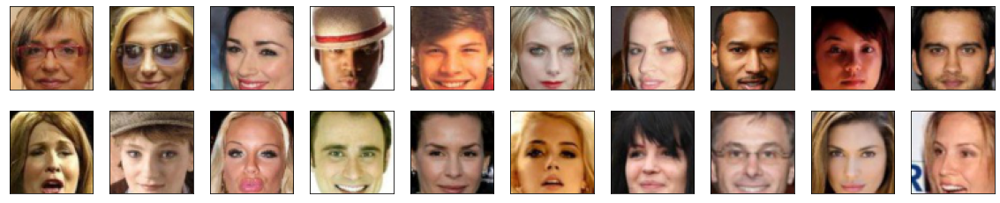

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
from torch import nn

In [9]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [10]:
class Discriminator(nn.Module):
    def __init__(self, conv_dim: int = 64):
        super(Discriminator, self).__init__()
        self.conv_dim = conv_dim

        # 64x64 input
        self.conv1 = ConvBlock(3, self.conv_dim, 4, batch_norm=False) # first layer, no batch_norm
        # 32x32 out
        self.conv2 = ConvBlock(self.conv_dim, self.conv_dim*2, 4)
        # 16x16 out
        self.conv3 = ConvBlock(self.conv_dim*2, self.conv_dim*4, 4)
        # 8x8 out
        
        self.flatten = nn.Flatten()
        # final, fully-connected layer
        self.fc = nn.Linear(self.conv_dim*4*8*8, 1)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # all hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        # flatten
        x = self.flatten(x)
        # final output layer
        x = self.fc(x)

        return x 

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cellato check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


In [12]:
print(discriminator)

Discriminator(
  (conv1): ConvBlock(
    (conv): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (conv2): ConvBlock(
    (conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (conv3): ConvBlock(
    (conv): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc): Linear(in_features=16384, out_features=1, bias=True)
)


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [13]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [14]:
class Generator(nn.Module):
    def __init__(self, latent_dim: int, conv_dim: int = 64):
        super(Generator, self).__init__()
        # transpose conv layers
        self.conv_dim = conv_dim
        self.deconv1 = DeconvBlock(latent_dim, self.conv_dim*8, 4, 1, 0)
        self.deconv2 = DeconvBlock(self.conv_dim*8, self.conv_dim*4, 4, 2, 1)
        self.deconv3 = DeconvBlock(self.conv_dim*4, self.conv_dim*2, 4, 2, 1)
        self.deconv4 = DeconvBlock(self.conv_dim*2, self.conv_dim, 4, 2, 1)
        self.deconv5 = nn.ConvTranspose2d(self.conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        x = self.last_activation(x)
        return x
    


In [15]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


In [16]:
print(generator)

Generator(
  (deconv1): DeconvBlock(
    (deconv): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): ReLU()
  )
  (deconv2): DeconvBlock(
    (deconv): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): ReLU()
  )
  (deconv3): DeconvBlock(
    (deconv): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): ReLU()
  )
  (deconv4): DeconvBlock(
    (deconv): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): ReLU()
  )
  (deconv5)

## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [17]:
import torch.optim as optim

# params
lr = 0.0002
beta1=0.5
beta2=0.999 # default value


def create_optimizers(generator: nn.Module, discriminator: nn.Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [18]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

In [37]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    loss = real_loss(fake_logits) 
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [20]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    d_real_loss = real_loss(real_logits)
    d_fake_loss = fake_loss(fake_logits)
    loss = d_real_loss + d_fake_loss
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [21]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [29]:
train_on_gpu = torch.cuda.is_available()

In [30]:
def generator_step(generator: nn.Module, discriminator: nn.Module, g_optimizer,
                   batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    g_optimizer.zero_grad()
        
    # 1. Train with fake images and flipped labels

    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    if train_on_gpu:
        z = z.cuda()
    fake_images = generator(z)

    # Compute the discriminator losses on fake images 
    # using flipped labels!
    D_fake = discriminator(fake_images)
    g_loss = generator_loss(D_fake) # use real loss to flip labels

    # perform backprop
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(generator: nn.Module, discriminator: nn.Module, d_optimizer,
                       batch_size: int, latent_dim: int, 
                       real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    d_optimizer.zero_grad()
    
    # Compute the discriminator losses on real images 
    if train_on_gpu:
        real_images = real_images.cuda()

    D_real = discriminator(real_images)

    # 2. Train with fake images

    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    # move x to GPU, if available
    if train_on_gpu:
        z = z.cuda()
    fake_images = generator(z)

    # Compute the discriminator losses on fake images            
    D_fake = discriminator(fake_images.detach())

    # add up loss and perform backprop
    d_loss = discriminator_loss(D_real, D_fake)
    d_loss.backward()
    d_optimizer.step()
    
    gp = None
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [31]:
from datetime import datetime

In [32]:
# you can experiment with different dimensions of latent spaces
latent_dim = 256

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 32

# number of images in each batch
batch_size = 64

In [33]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [34]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-09-20 08:57:39 | Epoch [1/32] | Batch 0/509 | d_loss: 1.3935 | g_loss: 1.7967
2024-09-20 08:57:44 | Epoch [1/32] | Batch 50/509 | d_loss: 0.2537 | g_loss: 5.4260
2024-09-20 08:57:49 | Epoch [1/32] | Batch 100/509 | d_loss: 3.4797 | g_loss: 12.7725
2024-09-20 08:57:54 | Epoch [1/32] | Batch 150/509 | d_loss: 0.6125 | g_loss: 7.2726
2024-09-20 08:57:59 | Epoch [1/32] | Batch 200/509 | d_loss: 0.3244 | g_loss: 3.5668
2024-09-20 08:58:04 | Epoch [1/32] | Batch 250/509 | d_loss: 0.3745 | g_loss: 5.4459
2024-09-20 08:58:09 | Epoch [1/32] | Batch 300/509 | d_loss: 0.6542 | g_loss: 5.8072
2024-09-20 08:58:14 | Epoch [1/32] | Batch 350/509 | d_loss: 0.8083 | g_loss: 8.2048
2024-09-20 08:58:19 | Epoch [1/32] | Batch 400/509 | d_loss: 0.2210 | g_loss: 3.2870
2024-09-20 08:58:24 | Epoch [1/32] | Batch 450/509 | d_loss: 0.3519 | g_loss: 3.7880
2024-09-20 08:58:29 | Epoch [1/32] | Batch 500/509 | d_loss: 0.9021 | g_loss: 2.5576


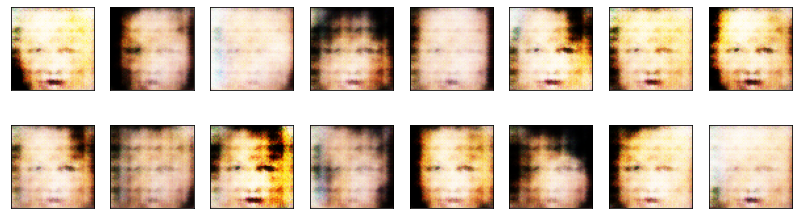

2024-09-20 08:58:34 | Epoch [2/32] | Batch 0/509 | d_loss: 2.2222 | g_loss: 8.8285
2024-09-20 08:58:39 | Epoch [2/32] | Batch 50/509 | d_loss: 0.4152 | g_loss: 4.4457
2024-09-20 08:58:44 | Epoch [2/32] | Batch 100/509 | d_loss: 0.5578 | g_loss: 4.6854
2024-09-20 08:58:49 | Epoch [2/32] | Batch 150/509 | d_loss: 0.7845 | g_loss: 4.8743
2024-09-20 08:58:54 | Epoch [2/32] | Batch 200/509 | d_loss: 0.8031 | g_loss: 3.4907
2024-09-20 08:58:59 | Epoch [2/32] | Batch 250/509 | d_loss: 0.3489 | g_loss: 3.5079
2024-09-20 08:59:04 | Epoch [2/32] | Batch 300/509 | d_loss: 1.2246 | g_loss: 5.0950
2024-09-20 08:59:09 | Epoch [2/32] | Batch 350/509 | d_loss: 0.3631 | g_loss: 3.9212
2024-09-20 08:59:14 | Epoch [2/32] | Batch 400/509 | d_loss: 0.3838 | g_loss: 2.7482
2024-09-20 08:59:19 | Epoch [2/32] | Batch 450/509 | d_loss: 0.3134 | g_loss: 3.3949
2024-09-20 08:59:24 | Epoch [2/32] | Batch 500/509 | d_loss: 1.5857 | g_loss: 2.8165


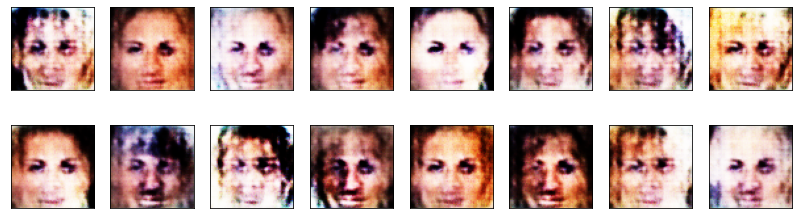

2024-09-20 08:59:28 | Epoch [3/32] | Batch 0/509 | d_loss: 0.6786 | g_loss: 4.7661
2024-09-20 08:59:33 | Epoch [3/32] | Batch 50/509 | d_loss: 0.4372 | g_loss: 3.7632
2024-09-20 08:59:38 | Epoch [3/32] | Batch 100/509 | d_loss: 0.6236 | g_loss: 4.3980
2024-09-20 08:59:43 | Epoch [3/32] | Batch 150/509 | d_loss: 0.6769 | g_loss: 4.3778
2024-09-20 08:59:48 | Epoch [3/32] | Batch 200/509 | d_loss: 0.6952 | g_loss: 4.8089
2024-09-20 08:59:53 | Epoch [3/32] | Batch 250/509 | d_loss: 0.7160 | g_loss: 5.0281
2024-09-20 08:59:59 | Epoch [3/32] | Batch 300/509 | d_loss: 0.6333 | g_loss: 4.3928
2024-09-20 09:00:04 | Epoch [3/32] | Batch 350/509 | d_loss: 0.5959 | g_loss: 4.3033
2024-09-20 09:00:09 | Epoch [3/32] | Batch 400/509 | d_loss: 1.2683 | g_loss: 6.6511
2024-09-20 09:00:14 | Epoch [3/32] | Batch 450/509 | d_loss: 1.0284 | g_loss: 7.7696
2024-09-20 09:00:19 | Epoch [3/32] | Batch 500/509 | d_loss: 0.4106 | g_loss: 3.2671


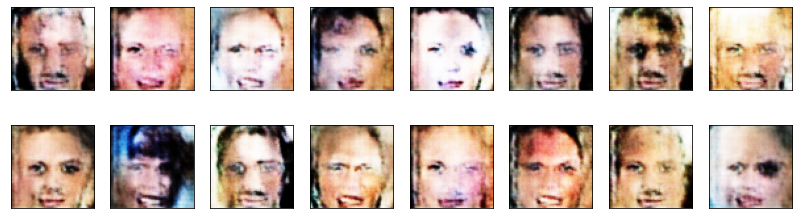

2024-09-20 09:00:23 | Epoch [4/32] | Batch 0/509 | d_loss: 0.3720 | g_loss: 3.5614
2024-09-20 09:00:29 | Epoch [4/32] | Batch 50/509 | d_loss: 0.6711 | g_loss: 3.1180
2024-09-20 09:00:34 | Epoch [4/32] | Batch 100/509 | d_loss: 0.8027 | g_loss: 2.7350
2024-09-20 09:00:39 | Epoch [4/32] | Batch 150/509 | d_loss: 0.2406 | g_loss: 2.5452
2024-09-20 09:00:44 | Epoch [4/32] | Batch 200/509 | d_loss: 0.3176 | g_loss: 2.5796
2024-09-20 09:00:49 | Epoch [4/32] | Batch 250/509 | d_loss: 1.1356 | g_loss: 1.9700
2024-09-20 09:00:54 | Epoch [4/32] | Batch 300/509 | d_loss: 0.4875 | g_loss: 3.8961
2024-09-20 09:00:59 | Epoch [4/32] | Batch 350/509 | d_loss: 0.4290 | g_loss: 3.0817
2024-09-20 09:01:04 | Epoch [4/32] | Batch 400/509 | d_loss: 0.6199 | g_loss: 2.6589
2024-09-20 09:01:09 | Epoch [4/32] | Batch 450/509 | d_loss: 0.4633 | g_loss: 3.0029
2024-09-20 09:01:14 | Epoch [4/32] | Batch 500/509 | d_loss: 0.6813 | g_loss: 2.3098


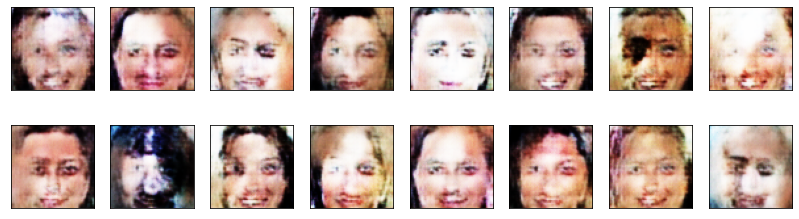

2024-09-20 09:01:17 | Epoch [5/32] | Batch 0/509 | d_loss: 0.5347 | g_loss: 2.6165
2024-09-20 09:01:22 | Epoch [5/32] | Batch 50/509 | d_loss: 0.4058 | g_loss: 3.4660
2024-09-20 09:01:27 | Epoch [5/32] | Batch 100/509 | d_loss: 0.6367 | g_loss: 5.2236
2024-09-20 09:01:32 | Epoch [5/32] | Batch 150/509 | d_loss: 0.4856 | g_loss: 1.9967
2024-09-20 09:01:37 | Epoch [5/32] | Batch 200/509 | d_loss: 1.3478 | g_loss: 5.9929
2024-09-20 09:01:42 | Epoch [5/32] | Batch 250/509 | d_loss: 0.3450 | g_loss: 3.5746
2024-09-20 09:01:47 | Epoch [5/32] | Batch 300/509 | d_loss: 0.3790 | g_loss: 2.4795
2024-09-20 09:01:52 | Epoch [5/32] | Batch 350/509 | d_loss: 0.3222 | g_loss: 3.4449
2024-09-20 09:01:57 | Epoch [5/32] | Batch 400/509 | d_loss: 0.7486 | g_loss: 5.6265
2024-09-20 09:02:02 | Epoch [5/32] | Batch 450/509 | d_loss: 0.2553 | g_loss: 2.8408
2024-09-20 09:02:07 | Epoch [5/32] | Batch 500/509 | d_loss: 0.2133 | g_loss: 3.7339


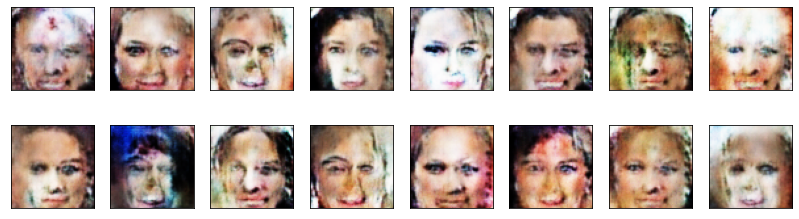

2024-09-20 09:02:12 | Epoch [6/32] | Batch 0/509 | d_loss: 0.3598 | g_loss: 2.8328
2024-09-20 09:02:17 | Epoch [6/32] | Batch 50/509 | d_loss: 1.0293 | g_loss: 6.0320
2024-09-20 09:02:22 | Epoch [6/32] | Batch 100/509 | d_loss: 0.8530 | g_loss: 6.2768
2024-09-20 09:02:27 | Epoch [6/32] | Batch 150/509 | d_loss: 0.3400 | g_loss: 3.4388
2024-09-20 09:02:32 | Epoch [6/32] | Batch 200/509 | d_loss: 0.5855 | g_loss: 5.5273
2024-09-20 09:02:37 | Epoch [6/32] | Batch 250/509 | d_loss: 0.5613 | g_loss: 4.8199
2024-09-20 09:02:42 | Epoch [6/32] | Batch 300/509 | d_loss: 0.4540 | g_loss: 5.3025
2024-09-20 09:02:47 | Epoch [6/32] | Batch 350/509 | d_loss: 0.4195 | g_loss: 2.9005
2024-09-20 09:02:52 | Epoch [6/32] | Batch 400/509 | d_loss: 0.9424 | g_loss: 6.0906
2024-09-20 09:02:57 | Epoch [6/32] | Batch 450/509 | d_loss: 1.2150 | g_loss: 2.5128
2024-09-20 09:03:02 | Epoch [6/32] | Batch 500/509 | d_loss: 0.1595 | g_loss: 3.3199


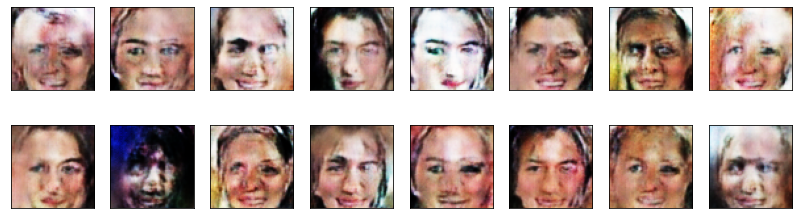

2024-09-20 09:03:07 | Epoch [7/32] | Batch 0/509 | d_loss: 0.1430 | g_loss: 4.1221
2024-09-20 09:03:12 | Epoch [7/32] | Batch 50/509 | d_loss: 0.2530 | g_loss: 3.3124
2024-09-20 09:03:17 | Epoch [7/32] | Batch 100/509 | d_loss: 0.4114 | g_loss: 4.0569
2024-09-20 09:03:22 | Epoch [7/32] | Batch 150/509 | d_loss: 0.1757 | g_loss: 3.5588
2024-09-20 09:03:27 | Epoch [7/32] | Batch 200/509 | d_loss: 0.5138 | g_loss: 3.8602
2024-09-20 09:03:32 | Epoch [7/32] | Batch 250/509 | d_loss: 0.0977 | g_loss: 3.3831
2024-09-20 09:03:37 | Epoch [7/32] | Batch 300/509 | d_loss: 0.4107 | g_loss: 3.2961
2024-09-20 09:03:42 | Epoch [7/32] | Batch 350/509 | d_loss: 1.2458 | g_loss: 4.3441
2024-09-20 09:03:47 | Epoch [7/32] | Batch 400/509 | d_loss: 0.6796 | g_loss: 6.6811
2024-09-20 09:03:52 | Epoch [7/32] | Batch 450/509 | d_loss: 0.2550 | g_loss: 2.9601
2024-09-20 09:03:57 | Epoch [7/32] | Batch 500/509 | d_loss: 0.2058 | g_loss: 2.9298


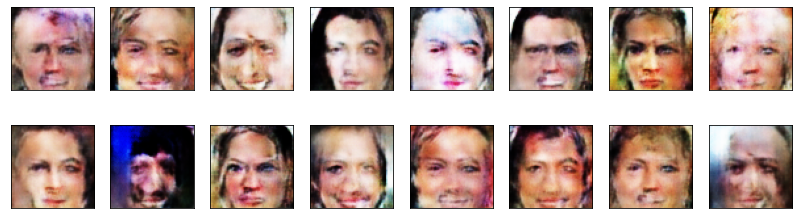

2024-09-20 09:04:01 | Epoch [8/32] | Batch 0/509 | d_loss: 0.2558 | g_loss: 4.7905
2024-09-20 09:04:06 | Epoch [8/32] | Batch 50/509 | d_loss: 1.2783 | g_loss: 3.1712
2024-09-20 09:04:11 | Epoch [8/32] | Batch 100/509 | d_loss: 0.0872 | g_loss: 5.9281
2024-09-20 09:04:16 | Epoch [8/32] | Batch 150/509 | d_loss: 0.5285 | g_loss: 5.5356
2024-09-20 09:04:21 | Epoch [8/32] | Batch 200/509 | d_loss: 0.3018 | g_loss: 4.8476
2024-09-20 09:04:26 | Epoch [8/32] | Batch 250/509 | d_loss: 0.4627 | g_loss: 4.5165
2024-09-20 09:04:31 | Epoch [8/32] | Batch 300/509 | d_loss: 0.0697 | g_loss: 3.6596
2024-09-20 09:04:36 | Epoch [8/32] | Batch 350/509 | d_loss: 0.3611 | g_loss: 4.9917
2024-09-20 09:04:41 | Epoch [8/32] | Batch 400/509 | d_loss: 0.2374 | g_loss: 2.8871
2024-09-20 09:04:46 | Epoch [8/32] | Batch 450/509 | d_loss: 0.2254 | g_loss: 2.6199
2024-09-20 09:04:51 | Epoch [8/32] | Batch 500/509 | d_loss: 0.1325 | g_loss: 3.3520


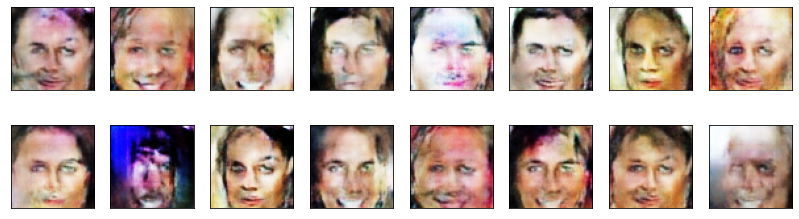

2024-09-20 09:04:55 | Epoch [9/32] | Batch 0/509 | d_loss: 0.5383 | g_loss: 5.4562
2024-09-20 09:05:00 | Epoch [9/32] | Batch 50/509 | d_loss: 2.5723 | g_loss: 4.2394
2024-09-20 09:05:05 | Epoch [9/32] | Batch 100/509 | d_loss: 0.2500 | g_loss: 3.5003
2024-09-20 09:05:10 | Epoch [9/32] | Batch 150/509 | d_loss: 0.3480 | g_loss: 4.3942
2024-09-20 09:05:15 | Epoch [9/32] | Batch 200/509 | d_loss: 0.1940 | g_loss: 3.7413
2024-09-20 09:05:20 | Epoch [9/32] | Batch 250/509 | d_loss: 0.3740 | g_loss: 4.3681
2024-09-20 09:05:25 | Epoch [9/32] | Batch 300/509 | d_loss: 0.2386 | g_loss: 6.4513
2024-09-20 09:05:30 | Epoch [9/32] | Batch 350/509 | d_loss: 0.8015 | g_loss: 5.6787
2024-09-20 09:05:35 | Epoch [9/32] | Batch 400/509 | d_loss: 0.1146 | g_loss: 4.1899
2024-09-20 09:05:40 | Epoch [9/32] | Batch 450/509 | d_loss: 0.0982 | g_loss: 2.2980
2024-09-20 09:05:45 | Epoch [9/32] | Batch 500/509 | d_loss: 0.2252 | g_loss: 6.1445


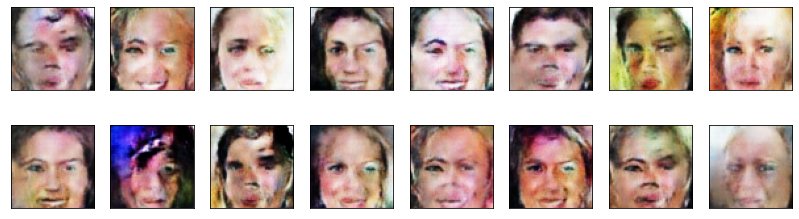

2024-09-20 09:05:50 | Epoch [10/32] | Batch 0/509 | d_loss: 0.3365 | g_loss: 5.3259
2024-09-20 09:05:55 | Epoch [10/32] | Batch 50/509 | d_loss: 0.1399 | g_loss: 4.5210
2024-09-20 09:06:00 | Epoch [10/32] | Batch 100/509 | d_loss: 0.1230 | g_loss: 4.1970
2024-09-20 09:06:05 | Epoch [10/32] | Batch 150/509 | d_loss: 0.0749 | g_loss: 2.7713
2024-09-20 09:06:10 | Epoch [10/32] | Batch 200/509 | d_loss: 0.1827 | g_loss: 5.9591
2024-09-20 09:06:15 | Epoch [10/32] | Batch 250/509 | d_loss: 0.3711 | g_loss: 4.4349
2024-09-20 09:06:20 | Epoch [10/32] | Batch 300/509 | d_loss: 0.1289 | g_loss: 4.8039
2024-09-20 09:06:25 | Epoch [10/32] | Batch 350/509 | d_loss: 0.3208 | g_loss: 4.8966
2024-09-20 09:06:30 | Epoch [10/32] | Batch 400/509 | d_loss: 0.0938 | g_loss: 3.9929
2024-09-20 09:06:35 | Epoch [10/32] | Batch 450/509 | d_loss: 0.3013 | g_loss: 4.1646
2024-09-20 09:06:40 | Epoch [10/32] | Batch 500/509 | d_loss: 0.1254 | g_loss: 4.0925


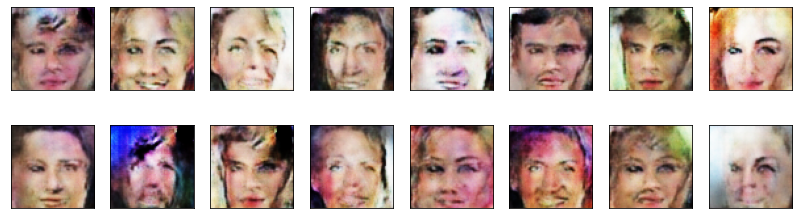

2024-09-20 09:06:45 | Epoch [11/32] | Batch 0/509 | d_loss: 0.2168 | g_loss: 3.7979
2024-09-20 09:06:50 | Epoch [11/32] | Batch 50/509 | d_loss: 0.1250 | g_loss: 4.2204
2024-09-20 09:06:55 | Epoch [11/32] | Batch 100/509 | d_loss: 0.1640 | g_loss: 3.5647
2024-09-20 09:07:00 | Epoch [11/32] | Batch 150/509 | d_loss: 0.0981 | g_loss: 7.2693
2024-09-20 09:07:05 | Epoch [11/32] | Batch 200/509 | d_loss: 4.0394 | g_loss: 14.6464
2024-09-20 09:07:10 | Epoch [11/32] | Batch 250/509 | d_loss: 0.2305 | g_loss: 3.6074
2024-09-20 09:07:15 | Epoch [11/32] | Batch 300/509 | d_loss: 0.1347 | g_loss: 4.2226
2024-09-20 09:07:20 | Epoch [11/32] | Batch 350/509 | d_loss: 0.1643 | g_loss: 3.3989
2024-09-20 09:07:25 | Epoch [11/32] | Batch 400/509 | d_loss: 0.8521 | g_loss: 4.0482
2024-09-20 09:07:30 | Epoch [11/32] | Batch 450/509 | d_loss: 0.2260 | g_loss: 3.3346
2024-09-20 09:07:35 | Epoch [11/32] | Batch 500/509 | d_loss: 1.0701 | g_loss: 4.4173


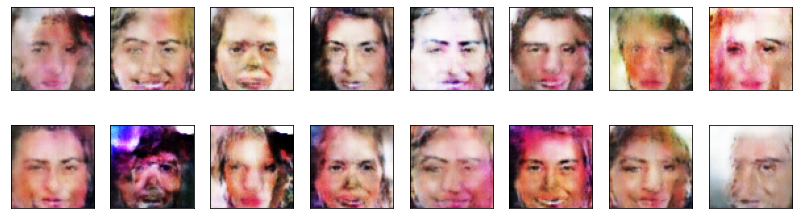

2024-09-20 09:07:39 | Epoch [12/32] | Batch 0/509 | d_loss: 0.1797 | g_loss: 5.5827
2024-09-20 09:07:45 | Epoch [12/32] | Batch 50/509 | d_loss: 0.2137 | g_loss: 4.5428
2024-09-20 09:07:50 | Epoch [12/32] | Batch 100/509 | d_loss: 0.1087 | g_loss: 4.2048
2024-09-20 09:07:55 | Epoch [12/32] | Batch 150/509 | d_loss: 0.1492 | g_loss: 5.5803
2024-09-20 09:08:00 | Epoch [12/32] | Batch 200/509 | d_loss: 0.1386 | g_loss: 8.3669
2024-09-20 09:08:05 | Epoch [12/32] | Batch 250/509 | d_loss: 0.0842 | g_loss: 3.5377
2024-09-20 09:08:10 | Epoch [12/32] | Batch 300/509 | d_loss: 0.2461 | g_loss: 6.0378
2024-09-20 09:08:15 | Epoch [12/32] | Batch 350/509 | d_loss: 0.1020 | g_loss: 5.5084
2024-09-20 09:08:20 | Epoch [12/32] | Batch 400/509 | d_loss: 0.0627 | g_loss: 5.9177
2024-09-20 09:08:25 | Epoch [12/32] | Batch 450/509 | d_loss: 0.6209 | g_loss: 10.1210
2024-09-20 09:08:30 | Epoch [12/32] | Batch 500/509 | d_loss: 0.1422 | g_loss: 4.8594


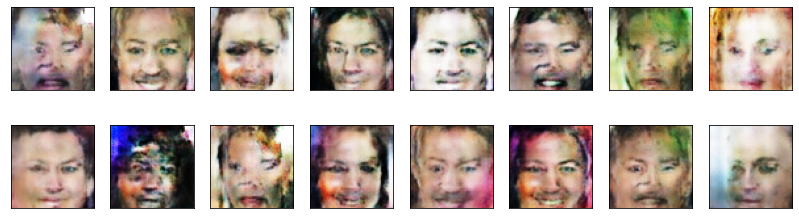

2024-09-20 09:08:34 | Epoch [13/32] | Batch 0/509 | d_loss: 0.1309 | g_loss: 5.3324
2024-09-20 09:08:39 | Epoch [13/32] | Batch 50/509 | d_loss: 0.1947 | g_loss: 3.4827
2024-09-20 09:08:44 | Epoch [13/32] | Batch 100/509 | d_loss: 0.1160 | g_loss: 5.1104
2024-09-20 09:08:49 | Epoch [13/32] | Batch 150/509 | d_loss: 0.1001 | g_loss: 4.7004
2024-09-20 09:08:54 | Epoch [13/32] | Batch 200/509 | d_loss: 0.2314 | g_loss: 3.7046
2024-09-20 09:08:59 | Epoch [13/32] | Batch 250/509 | d_loss: 0.1295 | g_loss: 3.7389
2024-09-20 09:09:04 | Epoch [13/32] | Batch 300/509 | d_loss: 0.2811 | g_loss: 4.5371
2024-09-20 09:09:09 | Epoch [13/32] | Batch 350/509 | d_loss: 0.2056 | g_loss: 4.6983
2024-09-20 09:09:14 | Epoch [13/32] | Batch 400/509 | d_loss: 0.2203 | g_loss: 4.1697
2024-09-20 09:09:19 | Epoch [13/32] | Batch 450/509 | d_loss: 0.1502 | g_loss: 5.2368
2024-09-20 09:09:24 | Epoch [13/32] | Batch 500/509 | d_loss: 0.8345 | g_loss: 10.7698


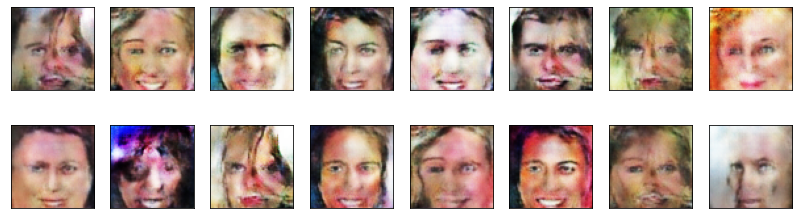

2024-09-20 09:09:29 | Epoch [14/32] | Batch 0/509 | d_loss: 0.1316 | g_loss: 4.8084
2024-09-20 09:09:34 | Epoch [14/32] | Batch 50/509 | d_loss: 0.1602 | g_loss: 3.8231
2024-09-20 09:09:39 | Epoch [14/32] | Batch 100/509 | d_loss: 0.2690 | g_loss: 3.5777
2024-09-20 09:09:44 | Epoch [14/32] | Batch 150/509 | d_loss: 0.1533 | g_loss: 3.7541
2024-09-20 09:09:49 | Epoch [14/32] | Batch 200/509 | d_loss: 0.2934 | g_loss: 4.7024
2024-09-20 09:09:54 | Epoch [14/32] | Batch 250/509 | d_loss: 0.2543 | g_loss: 6.9664
2024-09-20 09:09:59 | Epoch [14/32] | Batch 300/509 | d_loss: 0.1063 | g_loss: 3.2104
2024-09-20 09:10:04 | Epoch [14/32] | Batch 350/509 | d_loss: 0.0646 | g_loss: 4.2789
2024-09-20 09:10:09 | Epoch [14/32] | Batch 400/509 | d_loss: 0.0891 | g_loss: 4.2462
2024-09-20 09:10:14 | Epoch [14/32] | Batch 450/509 | d_loss: 0.1094 | g_loss: 4.1741
2024-09-20 09:10:19 | Epoch [14/32] | Batch 500/509 | d_loss: 0.0361 | g_loss: 4.3506


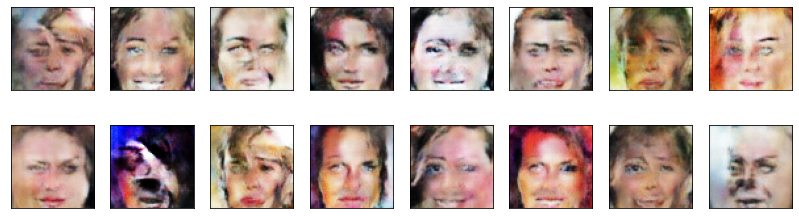

2024-09-20 09:10:24 | Epoch [15/32] | Batch 0/509 | d_loss: 0.0568 | g_loss: 4.3157
2024-09-20 09:10:29 | Epoch [15/32] | Batch 50/509 | d_loss: 0.0712 | g_loss: 3.7989
2024-09-20 09:10:34 | Epoch [15/32] | Batch 100/509 | d_loss: 0.3401 | g_loss: 3.6789
2024-09-20 09:10:39 | Epoch [15/32] | Batch 150/509 | d_loss: 0.1384 | g_loss: 4.0392
2024-09-20 09:10:44 | Epoch [15/32] | Batch 200/509 | d_loss: 0.1922 | g_loss: 5.0320
2024-09-20 09:10:49 | Epoch [15/32] | Batch 250/509 | d_loss: 0.3521 | g_loss: 6.8030
2024-09-20 09:10:54 | Epoch [15/32] | Batch 300/509 | d_loss: 0.3660 | g_loss: 6.3207
2024-09-20 09:10:59 | Epoch [15/32] | Batch 350/509 | d_loss: 0.1057 | g_loss: 2.9455
2024-09-20 09:11:04 | Epoch [15/32] | Batch 400/509 | d_loss: 0.2396 | g_loss: 3.1885
2024-09-20 09:11:09 | Epoch [15/32] | Batch 450/509 | d_loss: 0.1669 | g_loss: 4.3652
2024-09-20 09:11:14 | Epoch [15/32] | Batch 500/509 | d_loss: 0.1558 | g_loss: 5.8512


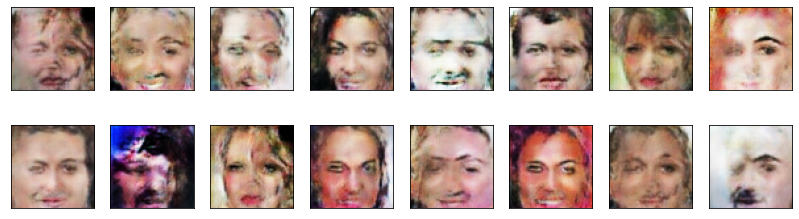

2024-09-20 09:11:18 | Epoch [16/32] | Batch 0/509 | d_loss: 0.1412 | g_loss: 4.9355
2024-09-20 09:11:23 | Epoch [16/32] | Batch 50/509 | d_loss: 0.2086 | g_loss: 4.3619
2024-09-20 09:11:28 | Epoch [16/32] | Batch 100/509 | d_loss: 0.1532 | g_loss: 3.8262
2024-09-20 09:11:33 | Epoch [16/32] | Batch 150/509 | d_loss: 0.2168 | g_loss: 4.9781
2024-09-20 09:11:38 | Epoch [16/32] | Batch 200/509 | d_loss: 0.1552 | g_loss: 5.7878
2024-09-20 09:11:43 | Epoch [16/32] | Batch 250/509 | d_loss: 0.3164 | g_loss: 5.9910
2024-09-20 09:11:48 | Epoch [16/32] | Batch 300/509 | d_loss: 0.2340 | g_loss: 3.2252
2024-09-20 09:11:53 | Epoch [16/32] | Batch 350/509 | d_loss: 0.2807 | g_loss: 5.9427
2024-09-20 09:11:58 | Epoch [16/32] | Batch 400/509 | d_loss: 0.0737 | g_loss: 4.8564
2024-09-20 09:12:03 | Epoch [16/32] | Batch 450/509 | d_loss: 1.0117 | g_loss: 6.8801
2024-09-20 09:12:08 | Epoch [16/32] | Batch 500/509 | d_loss: 0.2237 | g_loss: 2.9833


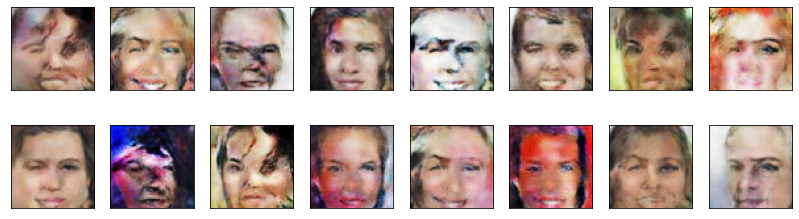

2024-09-20 09:12:13 | Epoch [17/32] | Batch 0/509 | d_loss: 0.0636 | g_loss: 3.9466
2024-09-20 09:12:18 | Epoch [17/32] | Batch 50/509 | d_loss: 0.3725 | g_loss: 5.5961
2024-09-20 09:12:23 | Epoch [17/32] | Batch 100/509 | d_loss: 0.1971 | g_loss: 3.9384
2024-09-20 09:12:28 | Epoch [17/32] | Batch 150/509 | d_loss: 0.2606 | g_loss: 5.8147
2024-09-20 09:12:33 | Epoch [17/32] | Batch 200/509 | d_loss: 0.5946 | g_loss: 4.6418
2024-09-20 09:12:38 | Epoch [17/32] | Batch 250/509 | d_loss: 0.2258 | g_loss: 4.7859
2024-09-20 09:12:43 | Epoch [17/32] | Batch 300/509 | d_loss: 0.4822 | g_loss: 4.4046
2024-09-20 09:12:48 | Epoch [17/32] | Batch 350/509 | d_loss: 0.8545 | g_loss: 4.4913
2024-09-20 09:12:53 | Epoch [17/32] | Batch 400/509 | d_loss: 0.5041 | g_loss: 9.0317
2024-09-20 09:12:58 | Epoch [17/32] | Batch 450/509 | d_loss: 0.2557 | g_loss: 4.0662
2024-09-20 09:13:03 | Epoch [17/32] | Batch 500/509 | d_loss: 0.3558 | g_loss: 2.8367


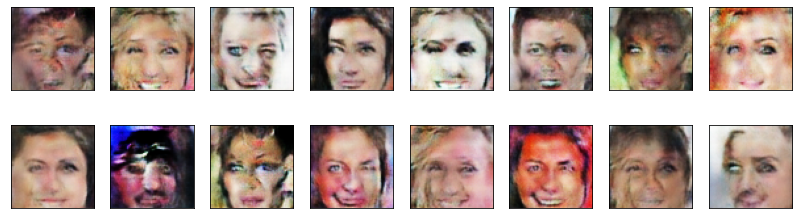

2024-09-20 09:13:08 | Epoch [18/32] | Batch 0/509 | d_loss: 0.1689 | g_loss: 4.6793
2024-09-20 09:13:13 | Epoch [18/32] | Batch 50/509 | d_loss: 0.2264 | g_loss: 3.4187
2024-09-20 09:13:18 | Epoch [18/32] | Batch 100/509 | d_loss: 1.4962 | g_loss: 12.3609
2024-09-20 09:13:23 | Epoch [18/32] | Batch 150/509 | d_loss: 0.2226 | g_loss: 5.7508
2024-09-20 09:13:28 | Epoch [18/32] | Batch 200/509 | d_loss: 0.1357 | g_loss: 3.7584
2024-09-20 09:13:33 | Epoch [18/32] | Batch 250/509 | d_loss: 0.3132 | g_loss: 5.3870
2024-09-20 09:13:38 | Epoch [18/32] | Batch 300/509 | d_loss: 0.3816 | g_loss: 8.7381
2024-09-20 09:13:43 | Epoch [18/32] | Batch 350/509 | d_loss: 0.1192 | g_loss: 5.7589
2024-09-20 09:13:48 | Epoch [18/32] | Batch 400/509 | d_loss: 0.0620 | g_loss: 4.3619
2024-09-20 09:13:53 | Epoch [18/32] | Batch 450/509 | d_loss: 0.4282 | g_loss: 3.8622
2024-09-20 09:13:58 | Epoch [18/32] | Batch 500/509 | d_loss: 6.6913 | g_loss: 0.6416


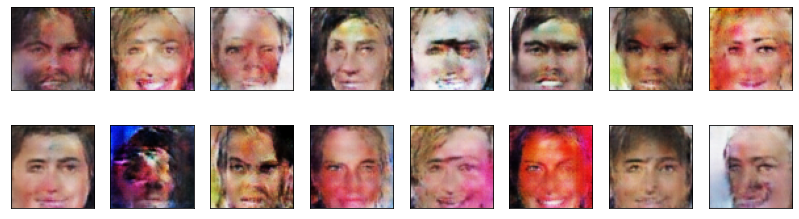

2024-09-20 09:14:03 | Epoch [19/32] | Batch 0/509 | d_loss: 2.9439 | g_loss: 1.6986
2024-09-20 09:14:08 | Epoch [19/32] | Batch 50/509 | d_loss: 0.2127 | g_loss: 5.3449
2024-09-20 09:14:13 | Epoch [19/32] | Batch 100/509 | d_loss: 0.1641 | g_loss: 3.9962
2024-09-20 09:14:18 | Epoch [19/32] | Batch 150/509 | d_loss: 0.1341 | g_loss: 4.2639
2024-09-20 09:14:23 | Epoch [19/32] | Batch 200/509 | d_loss: 0.2149 | g_loss: 4.3874
2024-09-20 09:14:28 | Epoch [19/32] | Batch 250/509 | d_loss: 0.1751 | g_loss: 3.2254
2024-09-20 09:14:33 | Epoch [19/32] | Batch 300/509 | d_loss: 0.1472 | g_loss: 4.8991
2024-09-20 09:14:38 | Epoch [19/32] | Batch 350/509 | d_loss: 0.2448 | g_loss: 3.9734
2024-09-20 09:14:43 | Epoch [19/32] | Batch 400/509 | d_loss: 0.1290 | g_loss: 4.8900
2024-09-20 09:14:48 | Epoch [19/32] | Batch 450/509 | d_loss: 0.1101 | g_loss: 3.4247
2024-09-20 09:14:53 | Epoch [19/32] | Batch 500/509 | d_loss: 0.2014 | g_loss: 3.1351


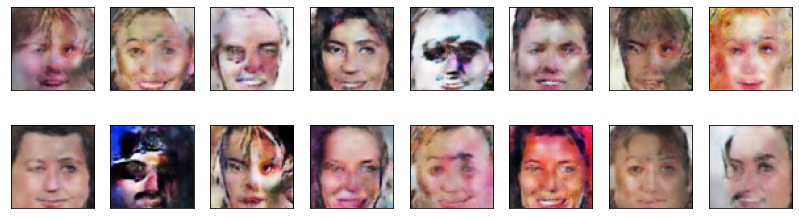

2024-09-20 09:14:58 | Epoch [20/32] | Batch 0/509 | d_loss: 0.1609 | g_loss: 4.4451
2024-09-20 09:15:03 | Epoch [20/32] | Batch 50/509 | d_loss: 0.1479 | g_loss: 4.2989
2024-09-20 09:15:08 | Epoch [20/32] | Batch 100/509 | d_loss: 0.1095 | g_loss: 5.0557
2024-09-20 09:15:13 | Epoch [20/32] | Batch 150/509 | d_loss: 0.1513 | g_loss: 5.2018
2024-09-20 09:15:18 | Epoch [20/32] | Batch 200/509 | d_loss: 0.1374 | g_loss: 3.4328
2024-09-20 09:15:23 | Epoch [20/32] | Batch 250/509 | d_loss: 0.4055 | g_loss: 3.9874
2024-09-20 09:15:28 | Epoch [20/32] | Batch 300/509 | d_loss: 0.3014 | g_loss: 5.6193
2024-09-20 09:15:33 | Epoch [20/32] | Batch 350/509 | d_loss: 0.1081 | g_loss: 3.8565
2024-09-20 09:15:38 | Epoch [20/32] | Batch 400/509 | d_loss: 0.3489 | g_loss: 3.3243
2024-09-20 09:15:43 | Epoch [20/32] | Batch 450/509 | d_loss: 0.2155 | g_loss: 5.3262
2024-09-20 09:15:48 | Epoch [20/32] | Batch 500/509 | d_loss: 0.2390 | g_loss: 2.5215


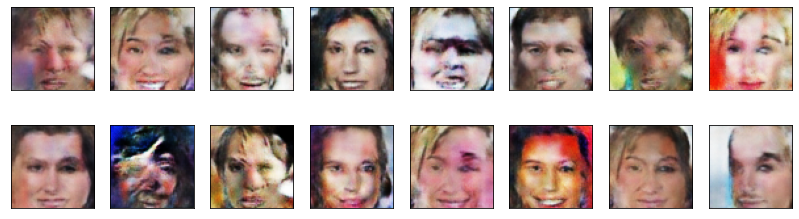

2024-09-20 09:15:53 | Epoch [21/32] | Batch 0/509 | d_loss: 0.0883 | g_loss: 5.4543
2024-09-20 09:15:59 | Epoch [21/32] | Batch 50/509 | d_loss: 0.0828 | g_loss: 4.7029
2024-09-20 09:16:04 | Epoch [21/32] | Batch 100/509 | d_loss: 0.1202 | g_loss: 4.3687
2024-09-20 09:16:09 | Epoch [21/32] | Batch 150/509 | d_loss: 6.7155 | g_loss: 1.4108
2024-09-20 09:16:14 | Epoch [21/32] | Batch 200/509 | d_loss: 0.1883 | g_loss: 3.9882
2024-09-20 09:16:19 | Epoch [21/32] | Batch 250/509 | d_loss: 0.1390 | g_loss: 5.7862
2024-09-20 09:16:24 | Epoch [21/32] | Batch 300/509 | d_loss: 0.0810 | g_loss: 4.7485
2024-09-20 09:16:29 | Epoch [21/32] | Batch 350/509 | d_loss: 0.3400 | g_loss: 4.4193
2024-09-20 09:16:34 | Epoch [21/32] | Batch 400/509 | d_loss: 0.2745 | g_loss: 3.0332
2024-09-20 09:16:39 | Epoch [21/32] | Batch 450/509 | d_loss: 0.1393 | g_loss: 3.6345
2024-09-20 09:16:44 | Epoch [21/32] | Batch 500/509 | d_loss: 0.3994 | g_loss: 2.2223


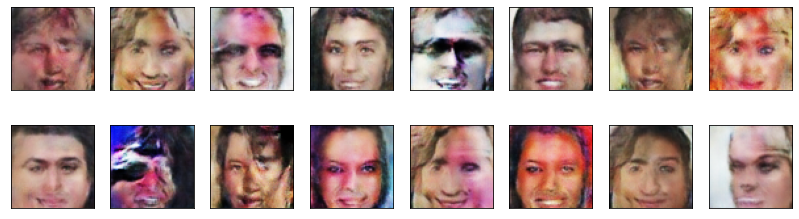

2024-09-20 09:16:48 | Epoch [22/32] | Batch 0/509 | d_loss: 0.1277 | g_loss: 4.3410
2024-09-20 09:16:53 | Epoch [22/32] | Batch 50/509 | d_loss: 0.1338 | g_loss: 3.2588
2024-09-20 09:16:58 | Epoch [22/32] | Batch 100/509 | d_loss: 0.0617 | g_loss: 3.9993
2024-09-20 09:17:03 | Epoch [22/32] | Batch 150/509 | d_loss: 0.4702 | g_loss: 7.0151
2024-09-20 09:17:08 | Epoch [22/32] | Batch 200/509 | d_loss: 0.2391 | g_loss: 4.3313
2024-09-20 09:17:13 | Epoch [22/32] | Batch 250/509 | d_loss: 0.2093 | g_loss: 4.0136
2024-09-20 09:17:18 | Epoch [22/32] | Batch 300/509 | d_loss: 0.2238 | g_loss: 5.6400
2024-09-20 09:17:23 | Epoch [22/32] | Batch 350/509 | d_loss: 0.1890 | g_loss: 4.4270
2024-09-20 09:17:28 | Epoch [22/32] | Batch 400/509 | d_loss: 0.2991 | g_loss: 4.4226
2024-09-20 09:17:33 | Epoch [22/32] | Batch 450/509 | d_loss: 0.0702 | g_loss: 5.6344
2024-09-20 09:17:38 | Epoch [22/32] | Batch 500/509 | d_loss: 0.2079 | g_loss: 4.2961


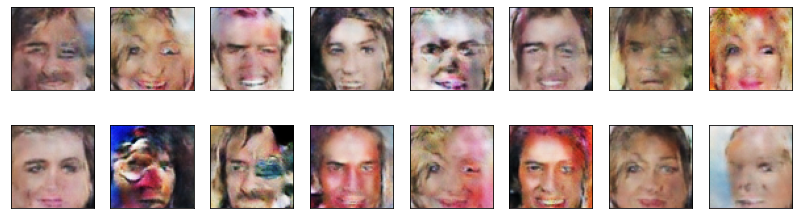

2024-09-20 09:17:42 | Epoch [23/32] | Batch 0/509 | d_loss: 0.1801 | g_loss: 4.1565
2024-09-20 09:17:47 | Epoch [23/32] | Batch 50/509 | d_loss: 0.4426 | g_loss: 4.4454
2024-09-20 09:17:52 | Epoch [23/32] | Batch 100/509 | d_loss: 0.1811 | g_loss: 5.4604
2024-09-20 09:17:57 | Epoch [23/32] | Batch 150/509 | d_loss: 0.1395 | g_loss: 3.4430
2024-09-20 09:18:02 | Epoch [23/32] | Batch 200/509 | d_loss: 0.1414 | g_loss: 4.5823
2024-09-20 09:18:07 | Epoch [23/32] | Batch 250/509 | d_loss: 0.1045 | g_loss: 4.9109
2024-09-20 09:18:12 | Epoch [23/32] | Batch 300/509 | d_loss: 0.1563 | g_loss: 5.1349
2024-09-20 09:18:17 | Epoch [23/32] | Batch 350/509 | d_loss: 0.2103 | g_loss: 4.1080
2024-09-20 09:18:22 | Epoch [23/32] | Batch 400/509 | d_loss: 0.9613 | g_loss: 8.0955
2024-09-20 09:18:27 | Epoch [23/32] | Batch 450/509 | d_loss: 0.1298 | g_loss: 3.8075
2024-09-20 09:18:32 | Epoch [23/32] | Batch 500/509 | d_loss: 0.4360 | g_loss: 6.0200


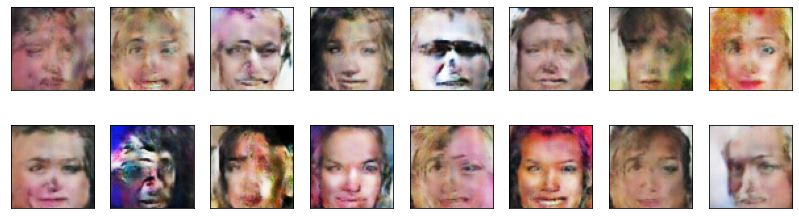

2024-09-20 09:18:37 | Epoch [24/32] | Batch 0/509 | d_loss: 0.1717 | g_loss: 3.5536
2024-09-20 09:18:43 | Epoch [24/32] | Batch 50/509 | d_loss: 0.1223 | g_loss: 5.0193
2024-09-20 09:18:48 | Epoch [24/32] | Batch 100/509 | d_loss: 0.1682 | g_loss: 4.6122
2024-09-20 09:18:53 | Epoch [24/32] | Batch 150/509 | d_loss: 0.0867 | g_loss: 4.6280
2024-09-20 09:18:58 | Epoch [24/32] | Batch 200/509 | d_loss: 0.2213 | g_loss: 4.5569
2024-09-20 09:19:03 | Epoch [24/32] | Batch 250/509 | d_loss: 2.5349 | g_loss: 1.3033
2024-09-20 09:19:08 | Epoch [24/32] | Batch 300/509 | d_loss: 0.2177 | g_loss: 4.1267
2024-09-20 09:19:13 | Epoch [24/32] | Batch 350/509 | d_loss: 0.1328 | g_loss: 4.8144
2024-09-20 09:19:18 | Epoch [24/32] | Batch 400/509 | d_loss: 0.0845 | g_loss: 4.2832
2024-09-20 09:19:23 | Epoch [24/32] | Batch 450/509 | d_loss: 0.1366 | g_loss: 7.0274
2024-09-20 09:19:28 | Epoch [24/32] | Batch 500/509 | d_loss: 0.1091 | g_loss: 3.4016


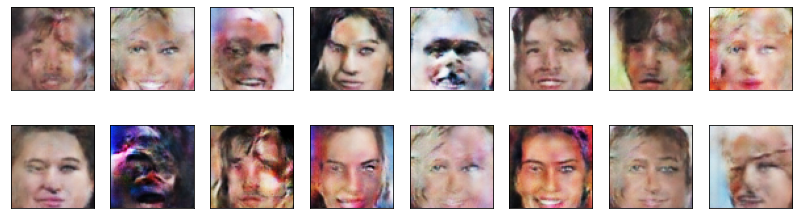

2024-09-20 09:19:33 | Epoch [25/32] | Batch 0/509 | d_loss: 0.2547 | g_loss: 4.9561
2024-09-20 09:19:38 | Epoch [25/32] | Batch 50/509 | d_loss: 0.1889 | g_loss: 3.4224
2024-09-20 09:19:43 | Epoch [25/32] | Batch 100/509 | d_loss: 0.1593 | g_loss: 4.6191
2024-09-20 09:19:48 | Epoch [25/32] | Batch 150/509 | d_loss: 2.5422 | g_loss: 2.9118
2024-09-20 09:19:53 | Epoch [25/32] | Batch 200/509 | d_loss: 0.1704 | g_loss: 4.8664
2024-09-20 09:19:58 | Epoch [25/32] | Batch 250/509 | d_loss: 0.3126 | g_loss: 5.7772
2024-09-20 09:20:03 | Epoch [25/32] | Batch 300/509 | d_loss: 0.1042 | g_loss: 5.8107
2024-09-20 09:20:08 | Epoch [25/32] | Batch 350/509 | d_loss: 0.1016 | g_loss: 3.5887
2024-09-20 09:20:13 | Epoch [25/32] | Batch 400/509 | d_loss: 0.1704 | g_loss: 2.9113
2024-09-20 09:20:18 | Epoch [25/32] | Batch 450/509 | d_loss: 0.2130 | g_loss: 3.0177
2024-09-20 09:20:23 | Epoch [25/32] | Batch 500/509 | d_loss: 0.4211 | g_loss: 2.7865


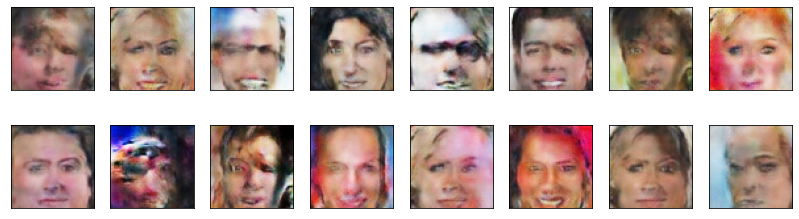

2024-09-20 09:20:27 | Epoch [26/32] | Batch 0/509 | d_loss: 0.1972 | g_loss: 5.9159
2024-09-20 09:20:32 | Epoch [26/32] | Batch 50/509 | d_loss: 0.1275 | g_loss: 5.2150
2024-09-20 09:20:37 | Epoch [26/32] | Batch 100/509 | d_loss: 0.1292 | g_loss: 5.9918
2024-09-20 09:20:42 | Epoch [26/32] | Batch 150/509 | d_loss: 0.2696 | g_loss: 3.3633
2024-09-20 09:20:47 | Epoch [26/32] | Batch 200/509 | d_loss: 0.0904 | g_loss: 3.5782
2024-09-20 09:20:52 | Epoch [26/32] | Batch 250/509 | d_loss: 0.1639 | g_loss: 5.1105
2024-09-20 09:20:57 | Epoch [26/32] | Batch 300/509 | d_loss: 0.2188 | g_loss: 4.5756
2024-09-20 09:21:02 | Epoch [26/32] | Batch 350/509 | d_loss: 0.2823 | g_loss: 4.7149
2024-09-20 09:21:07 | Epoch [26/32] | Batch 400/509 | d_loss: 0.1291 | g_loss: 2.6297
2024-09-20 09:21:12 | Epoch [26/32] | Batch 450/509 | d_loss: 0.1264 | g_loss: 4.4546
2024-09-20 09:21:17 | Epoch [26/32] | Batch 500/509 | d_loss: 0.0814 | g_loss: 4.3366


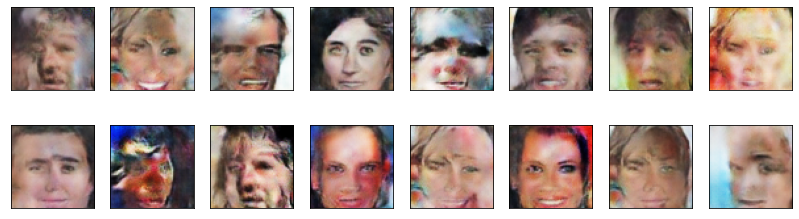

2024-09-20 09:21:22 | Epoch [27/32] | Batch 0/509 | d_loss: 0.1777 | g_loss: 3.9336
2024-09-20 09:21:27 | Epoch [27/32] | Batch 50/509 | d_loss: 0.0888 | g_loss: 5.1950
2024-09-20 09:21:32 | Epoch [27/32] | Batch 100/509 | d_loss: 0.1190 | g_loss: 4.5349
2024-09-20 09:21:37 | Epoch [27/32] | Batch 150/509 | d_loss: 0.1298 | g_loss: 7.0974
2024-09-20 09:21:42 | Epoch [27/32] | Batch 200/509 | d_loss: 0.6631 | g_loss: 2.0633
2024-09-20 09:21:47 | Epoch [27/32] | Batch 250/509 | d_loss: 0.1177 | g_loss: 6.4970
2024-09-20 09:21:52 | Epoch [27/32] | Batch 300/509 | d_loss: 0.1277 | g_loss: 4.9223
2024-09-20 09:21:57 | Epoch [27/32] | Batch 350/509 | d_loss: 0.0684 | g_loss: 8.4214
2024-09-20 09:22:02 | Epoch [27/32] | Batch 400/509 | d_loss: 0.2883 | g_loss: 5.0787
2024-09-20 09:22:07 | Epoch [27/32] | Batch 450/509 | d_loss: 0.1423 | g_loss: 7.7031
2024-09-20 09:22:12 | Epoch [27/32] | Batch 500/509 | d_loss: 0.8202 | g_loss: 7.0578


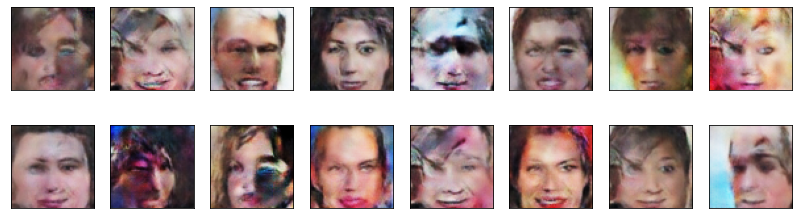

2024-09-20 09:22:16 | Epoch [28/32] | Batch 0/509 | d_loss: 0.4822 | g_loss: 3.6452
2024-09-20 09:22:21 | Epoch [28/32] | Batch 50/509 | d_loss: 0.1584 | g_loss: 4.5331
2024-09-20 09:22:26 | Epoch [28/32] | Batch 100/509 | d_loss: 0.3870 | g_loss: 5.5395
2024-09-20 09:22:31 | Epoch [28/32] | Batch 150/509 | d_loss: 0.1507 | g_loss: 5.0180
2024-09-20 09:22:36 | Epoch [28/32] | Batch 200/509 | d_loss: 0.1322 | g_loss: 4.1811
2024-09-20 09:22:41 | Epoch [28/32] | Batch 250/509 | d_loss: 0.0830 | g_loss: 3.7442
2024-09-20 09:22:46 | Epoch [28/32] | Batch 300/509 | d_loss: 0.1464 | g_loss: 4.0544
2024-09-20 09:22:51 | Epoch [28/32] | Batch 350/509 | d_loss: 0.1613 | g_loss: 4.5391
2024-09-20 09:22:56 | Epoch [28/32] | Batch 400/509 | d_loss: 0.2866 | g_loss: 3.2188
2024-09-20 09:23:02 | Epoch [28/32] | Batch 450/509 | d_loss: 0.2486 | g_loss: 4.8993
2024-09-20 09:23:07 | Epoch [28/32] | Batch 500/509 | d_loss: 0.1923 | g_loss: 6.0957


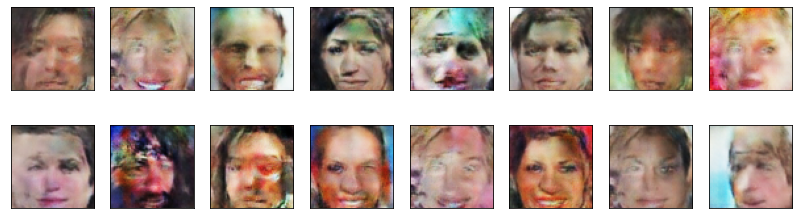

2024-09-20 09:23:11 | Epoch [29/32] | Batch 0/509 | d_loss: 0.2191 | g_loss: 4.2078
2024-09-20 09:23:16 | Epoch [29/32] | Batch 50/509 | d_loss: 0.2574 | g_loss: 4.0864
2024-09-20 09:23:21 | Epoch [29/32] | Batch 100/509 | d_loss: 0.1529 | g_loss: 3.7689
2024-09-20 09:23:26 | Epoch [29/32] | Batch 150/509 | d_loss: 0.8176 | g_loss: 1.3244
2024-09-20 09:23:31 | Epoch [29/32] | Batch 200/509 | d_loss: 0.3139 | g_loss: 4.7026
2024-09-20 09:23:36 | Epoch [29/32] | Batch 250/509 | d_loss: 0.4998 | g_loss: 7.2206
2024-09-20 09:23:41 | Epoch [29/32] | Batch 300/509 | d_loss: 0.1434 | g_loss: 3.5707
2024-09-20 09:23:46 | Epoch [29/32] | Batch 350/509 | d_loss: 0.1265 | g_loss: 5.2416
2024-09-20 09:23:51 | Epoch [29/32] | Batch 400/509 | d_loss: 0.0731 | g_loss: 7.6296
2024-09-20 09:23:56 | Epoch [29/32] | Batch 450/509 | d_loss: 0.4912 | g_loss: 4.4264
2024-09-20 09:24:01 | Epoch [29/32] | Batch 500/509 | d_loss: 0.2517 | g_loss: 5.6837


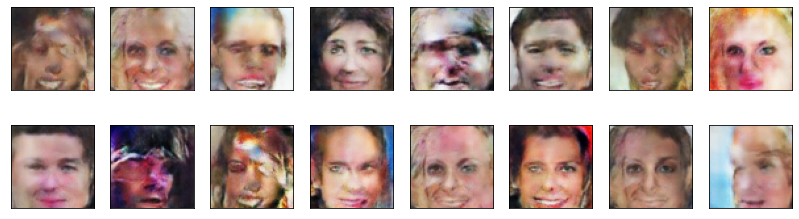

2024-09-20 09:24:05 | Epoch [30/32] | Batch 0/509 | d_loss: 1.1747 | g_loss: 14.4421
2024-09-20 09:24:10 | Epoch [30/32] | Batch 50/509 | d_loss: 0.2050 | g_loss: 4.5625
2024-09-20 09:24:15 | Epoch [30/32] | Batch 100/509 | d_loss: 0.2312 | g_loss: 3.1299
2024-09-20 09:24:20 | Epoch [30/32] | Batch 150/509 | d_loss: 0.1025 | g_loss: 3.3561
2024-09-20 09:24:25 | Epoch [30/32] | Batch 200/509 | d_loss: 0.1714 | g_loss: 2.2291
2024-09-20 09:24:30 | Epoch [30/32] | Batch 250/509 | d_loss: 0.2809 | g_loss: 4.1789
2024-09-20 09:24:35 | Epoch [30/32] | Batch 300/509 | d_loss: 0.1444 | g_loss: 3.6284
2024-09-20 09:24:40 | Epoch [30/32] | Batch 350/509 | d_loss: 0.1801 | g_loss: 4.6603
2024-09-20 09:24:45 | Epoch [30/32] | Batch 400/509 | d_loss: 0.5376 | g_loss: 3.9145
2024-09-20 09:24:50 | Epoch [30/32] | Batch 450/509 | d_loss: 0.2198 | g_loss: 5.1675
2024-09-20 09:24:55 | Epoch [30/32] | Batch 500/509 | d_loss: 0.1592 | g_loss: 4.5496


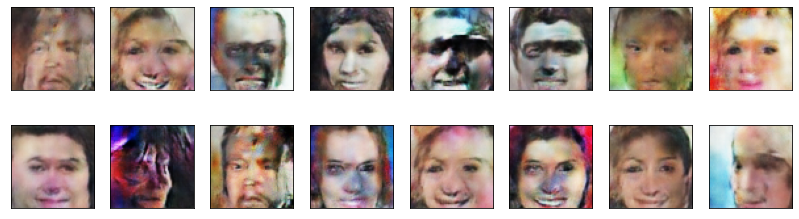

2024-09-20 09:25:00 | Epoch [31/32] | Batch 0/509 | d_loss: 0.2091 | g_loss: 4.5978
2024-09-20 09:25:05 | Epoch [31/32] | Batch 50/509 | d_loss: 0.1805 | g_loss: 4.1788
2024-09-20 09:25:10 | Epoch [31/32] | Batch 100/509 | d_loss: 0.2948 | g_loss: 2.4611
2024-09-20 09:25:15 | Epoch [31/32] | Batch 150/509 | d_loss: 0.1343 | g_loss: 3.5135
2024-09-20 09:25:20 | Epoch [31/32] | Batch 200/509 | d_loss: 0.1816 | g_loss: 4.0536
2024-09-20 09:25:25 | Epoch [31/32] | Batch 250/509 | d_loss: 0.3868 | g_loss: 3.7075
2024-09-20 09:25:30 | Epoch [31/32] | Batch 300/509 | d_loss: 0.1286 | g_loss: 4.3650
2024-09-20 09:25:35 | Epoch [31/32] | Batch 350/509 | d_loss: 0.1823 | g_loss: 3.5895
2024-09-20 09:25:40 | Epoch [31/32] | Batch 400/509 | d_loss: 0.2267 | g_loss: 3.8793
2024-09-20 09:25:45 | Epoch [31/32] | Batch 450/509 | d_loss: 0.1577 | g_loss: 3.7682
2024-09-20 09:25:50 | Epoch [31/32] | Batch 500/509 | d_loss: 0.3177 | g_loss: 4.5663


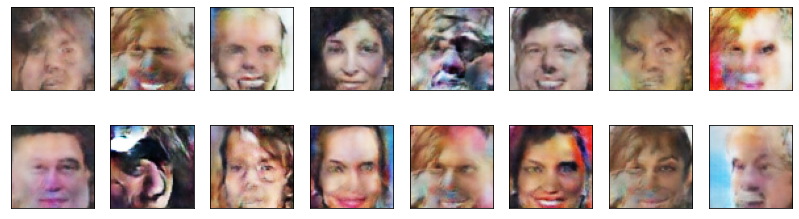

2024-09-20 09:25:55 | Epoch [32/32] | Batch 0/509 | d_loss: 0.6229 | g_loss: 6.8947
2024-09-20 09:26:00 | Epoch [32/32] | Batch 50/509 | d_loss: 0.1464 | g_loss: 4.0172
2024-09-20 09:26:05 | Epoch [32/32] | Batch 100/509 | d_loss: 0.2577 | g_loss: 4.9205
2024-09-20 09:26:10 | Epoch [32/32] | Batch 150/509 | d_loss: 0.1646 | g_loss: 6.4747
2024-09-20 09:26:15 | Epoch [32/32] | Batch 200/509 | d_loss: 0.1491 | g_loss: 4.0956
2024-09-20 09:26:20 | Epoch [32/32] | Batch 250/509 | d_loss: 0.2463 | g_loss: 3.4965
2024-09-20 09:26:25 | Epoch [32/32] | Batch 300/509 | d_loss: 0.1370 | g_loss: 4.8955
2024-09-20 09:26:30 | Epoch [32/32] | Batch 350/509 | d_loss: 0.1606 | g_loss: 3.2530
2024-09-20 09:26:35 | Epoch [32/32] | Batch 400/509 | d_loss: 1.3611 | g_loss: 9.1191
2024-09-20 09:26:40 | Epoch [32/32] | Batch 450/509 | d_loss: 0.2690 | g_loss: 4.2763
2024-09-20 09:26:45 | Epoch [32/32] | Batch 500/509 | d_loss: 0.2220 | g_loss: 4.2507


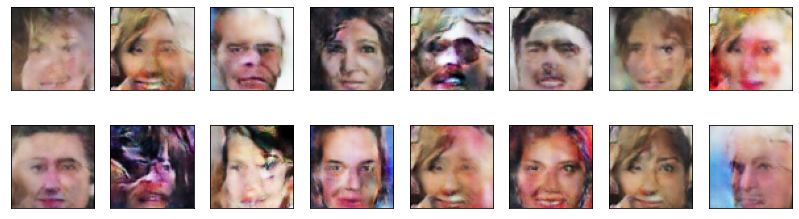

In [35]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        d_loss = discriminator_step(generator, discriminator, d_optimizer, batch_size, latent_dim, real_images)
        g_loss = generator_step(generator, discriminator, g_optimizer, batch_size, latent_dim)
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

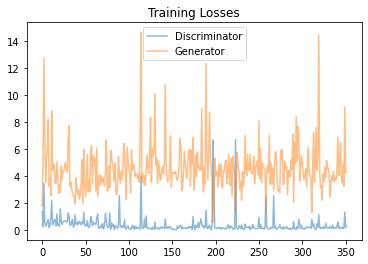

In [36]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)
* It is true, its mostly white faces that are generated. There is need to get some diverse data sets
* A 64 x 64 image is quite small to get the feature details that the generator will use to learn adequately. A large image of say 1024×1024 or 900×900 would have provide more value
* We could increase the number of epoch, add label smoothing, vary the drop out, or reduce the learning rate. These might have minimal impact however.
* We could try WGAN weserstein loss with gradient penalty or try  PROGAN approach of progressively add the layers while training. I understand Frechet distance and inception score are only used for evalution and not training, we could find a way to incorporate those metrics in training the GANs.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.